# 1. Generando un sliding window 

In [1]:
!pip install opencv-python-headless

     --------------------------------------- 39.4/39.4 MB 32.8 MB/s eta 0:00:00


In [2]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

In [5]:
!dir

 Volume in drive C has no label.
 Volume Serial Number is 8689-E141

 Directory of c:\Users\jaayg\OneDrive\Escritorio\computanional_vision\Platzi_project

05/17/2025  05:40 PM    <DIR>          .
05/17/2025  05:32 PM    <DIR>          ..
05/17/2025  05:42 PM    <DIR>          imagenes
05/17/2025  05:33 PM                 0 object_detection_v1.ipynb
               1 File(s)              0 bytes
               3 Dir(s)  201,250,037,760 bytes free


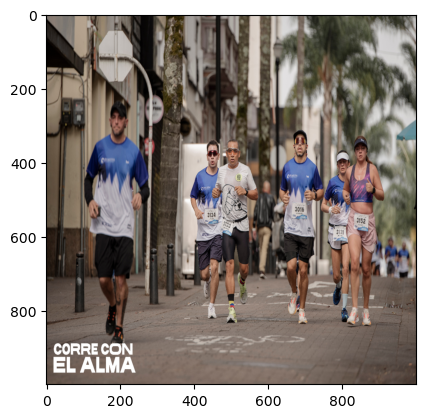

In [8]:
np_image = cv2.imread('./imagenes/image.jpg')
#Convert BGR to RGB
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB)
#It allow to me slide the image to more easy process
np_image = cv2.resize(np_image, dsize=(1000, 1000))
plt.imshow(np_image)

In [ ]:
def sliding_window(image, step, ws):
    #Control the size of the image with the window size
    for y in range(0,image.shape[0]-ws[1]+1, step):
        for x in range(0,image.shape[1]-ws[0]+1, step):
            #Window generation
            #Yield is a generator
            #It allow to me save memory
            yield (x, y, image[y:y+ws[1], x:x+ws[0]])

In [10]:
windows = sliding_window(np_image, step=200, ws=(200, 200))

In [11]:
os.makedirs('sliding_window')

C:\Users\jaayg\AppData\Local\Temp\ipykernel_24244\3553654202.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))


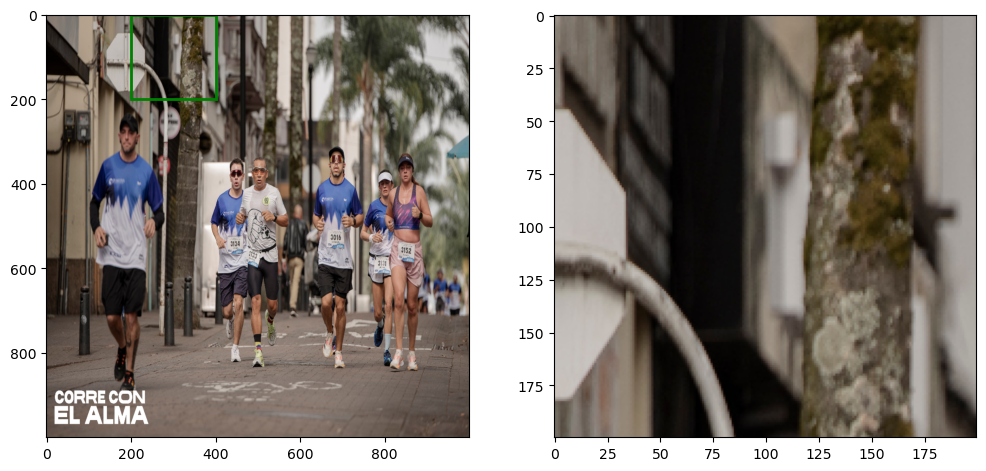

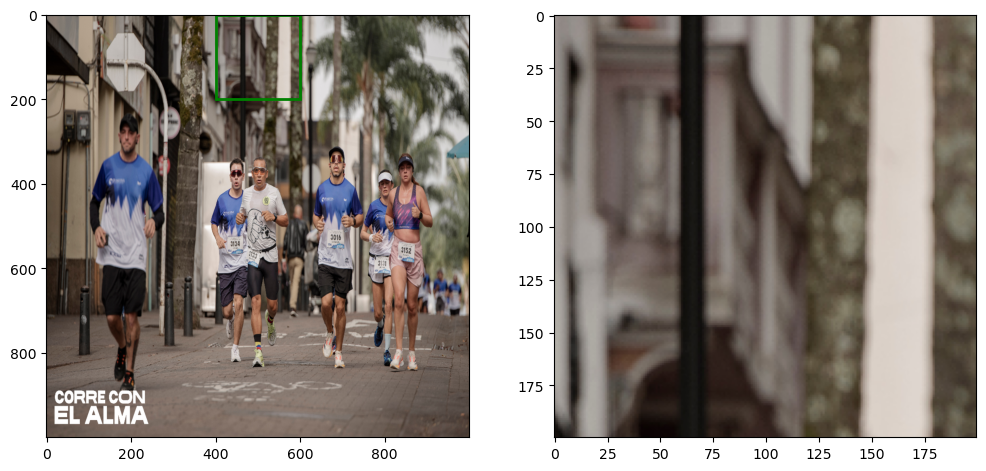

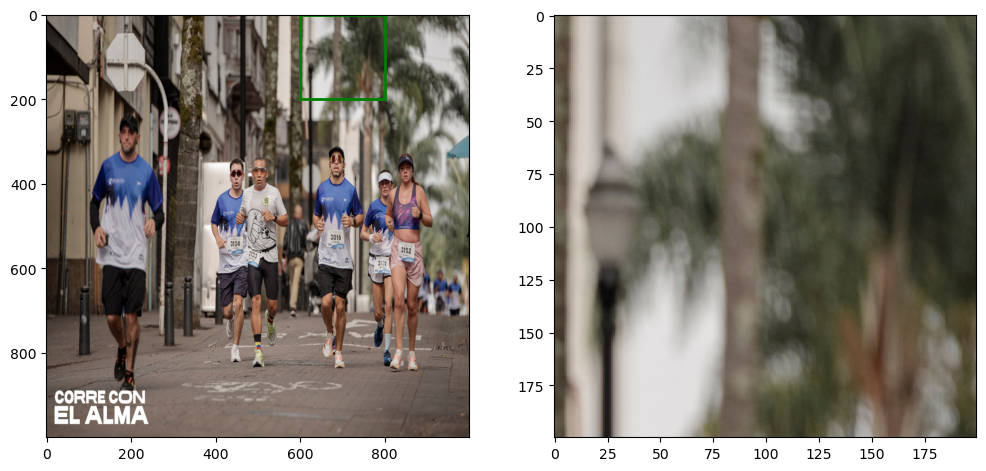

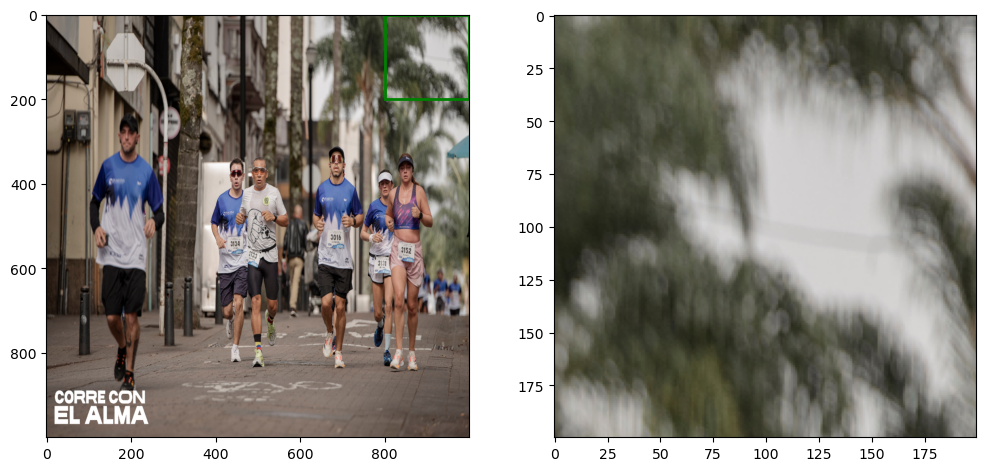

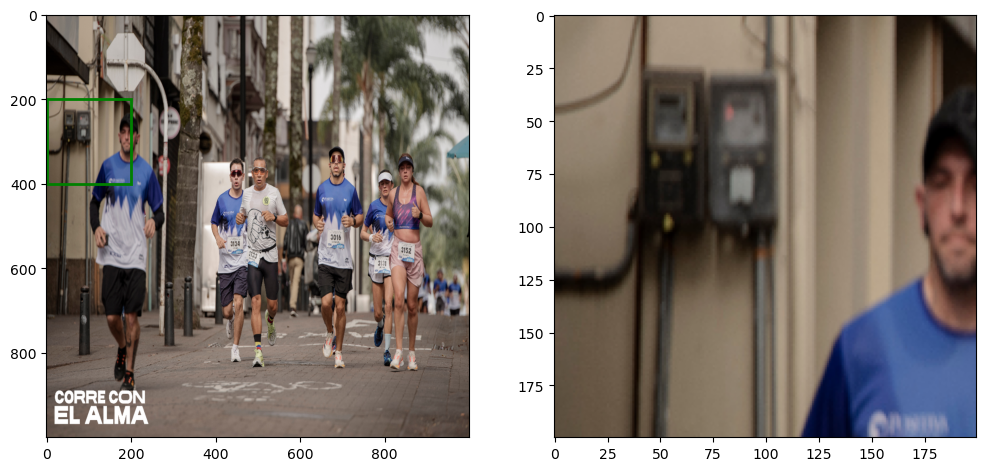

...

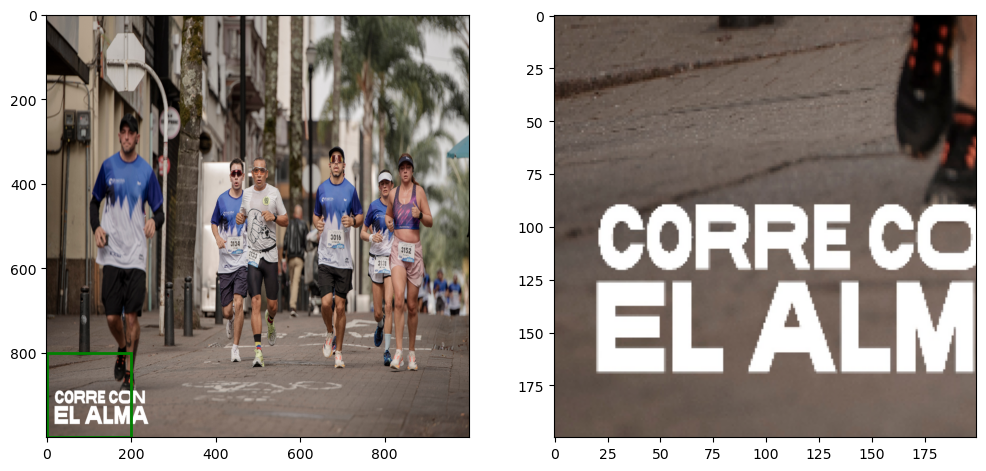

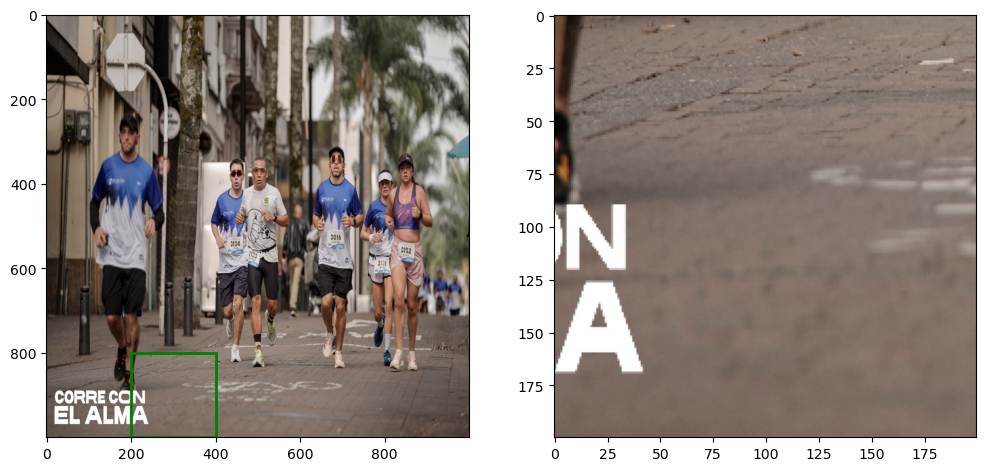

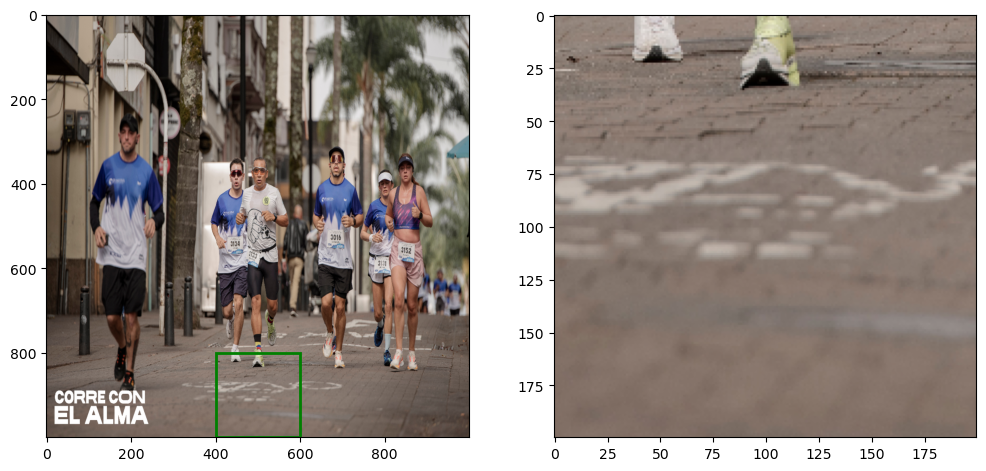

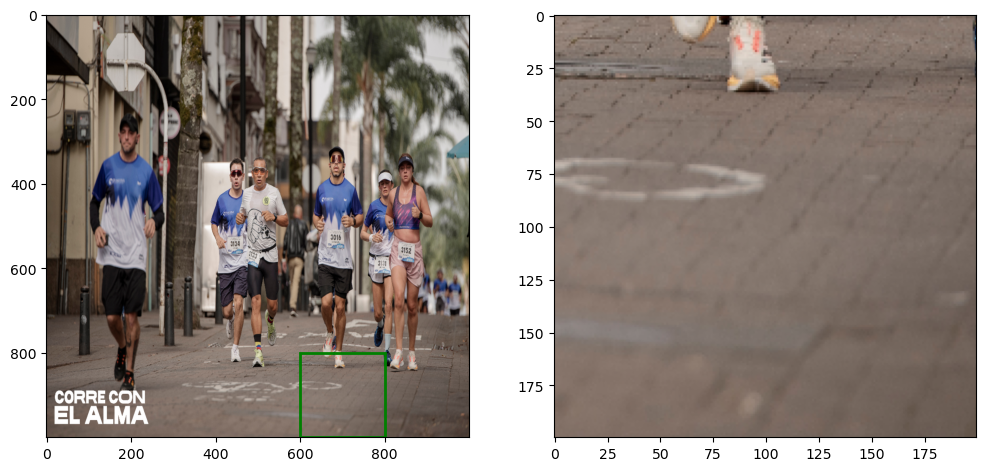

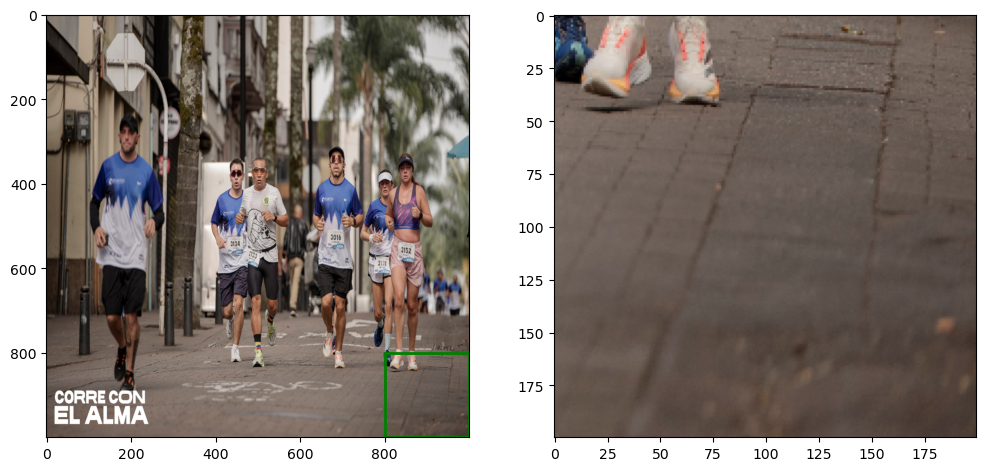

In [13]:
for x, window in enumerate(windows):
    f, axarr = plt.subplots(1, 2, figsize=(12, 12))
    axarr[0].imshow(np_image)
    rect = patches.Rectangle((window[0], window[1]), 200, 200, linewidth=2, edgecolor='g', facecolor='none')
    axarr[0].add_patch(rect)
    axarr[1].imshow(window[2])
    f.savefig(f'sliding_window/{x}.png', dpi=f.dpi)